In [91]:
import math
import statistics as st
import numpy as np
from scipy.stats import norm
from scipy.optimize import brentq
from scipy.optimize import minimize
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
from typing import Any

In [92]:
def get_price_df(day):
    file_name = f"../../data/round4/prices_round_4_day_{day}.csv"
    df = pd.read_csv(file_name, sep=';')
    df['timestamp'] = df['timestamp'] + 1_000_000 * (day)
    return df

def get_factor_df(day):
    file_name = f"../../data/round4/observations_round_4_day_{day}.csv"
    df = pd.read_csv(file_name, sep=',')
    df['timestamp'] = df['timestamp'] + 1_000_000 * (day)
    return df

def get_product(df, product):
    return df[df['product'] == product].copy()

def get_all_price_dfs():
    first_df = get_price_df(1)
    #return first_df
    second_df = get_price_df(2)
    third_df = get_price_df(3)
    return pd.concat([first_df, second_df, third_df])

def get_all_factor_dfs():
    first_df = get_factor_df(1)
    #return first_df
    second_df = get_factor_df(2)
    third_df = get_factor_df(3)
    return pd.concat([first_df, second_df, third_df])

In [93]:
price_df = get_all_price_dfs()
factor_df = get_all_factor_dfs()

In [94]:
macaron_df = get_product(price_df, 'MAGNIFICENT_MACARONS')
all_df = macaron_df.merge(factor_df, on='timestamp', how='inner')

In [95]:
# calculate smoothed trend
macaron_trend = all_df['mid_price'].ewm(alpha=0.05).mean().reset_index(drop=True)

# insert into df after mid_price
mid_price_index = all_df.columns.get_loc('mid_price')
all_df.insert(mid_price_index + 1, 'MACARON_TREND', macaron_trend)

# calculate sunlight diff
all_df['sun_DIFF'] = np.abs(all_df['sunlightIndex'] - 60)

In [96]:
# subplot fig with separate y-axes for each factor
fig = make_subplots(specs=[[{"secondary_y": True}]])

# add traces for each factor
fig.add_trace(go.Scatter(x=all_df['timestamp'], y=all_df['mid_price'], name='Macarons Price'), secondary_y=False)
fig.add_trace(go.Scatter(x=all_df['timestamp'], y=all_df['MACARON_TREND'], name='Macaron Trend'), secondary_y=False)
fig.add_trace(go.Scatter(x=all_df['timestamp'], y=all_df['transportFees'], name='Transport Fees'), secondary_y=True)
fig.add_trace(go.Scatter(x=all_df['timestamp'], y=all_df['exportTariff'], name='Export Tariff'), secondary_y=True)
fig.add_trace(go.Scatter(x=all_df['timestamp'], y=all_df['importTariff'], name='Import Tariff'), secondary_y=True)
fig.add_trace(go.Scatter(x=all_df['timestamp'], y=all_df['sugarPrice'], name='Sugar'), secondary_y=True)
fig.add_trace(go.Scatter(x=all_df['timestamp'], y=all_df['sunlightIndex'], name='Sunlight'), secondary_y=True)
fig.add_trace(go.Scatter(x=all_df['timestamp'], y=all_df['sun_DIFF'], name='Sun Diff'), secondary_y=True)

# Set the layout and axis properties
fig.update_layout(
    title='Factor Values over Time',
    xaxis_title='Timestamp',
    yaxis_title='Macarons',
    legend=dict(x=0, y=1.15, orientation='h')
)

# Update y-axis titles
fig.update_yaxes(title_text="Macarons", secondary_y=False)
fig.update_yaxes(title_text="Factors", secondary_y=True)

# Show the plot
fig.show()

### Visual Conclusions
- Transport Fees appear to be uncorrelated, they just go up over time.
- Export Tariffs might have some correlation? they appear to lag prices at times, maybe spurious.
- Import Tariffs appear to be uncorrelated.
- *Maybe* sharp drops in sunlight levels are correlated with price hikes, but low frequency.
- Sugar prices appear to be highly correlated (economically makes sense), maybe we try lagging prices, etc.

In [84]:
def get_prev_returns(df, col, its):
    prev_col = f"{col}_prev_{its}_its"
    df[prev_col] = df[col].shift(its)
    df[f"{col}_returns_from_{its}_its_ago"] = (df[col] - df[prev_col]) / df[prev_col]

    df.drop(columns=[prev_col], inplace=True)
    return df

def get_future_returns(df, col, its):
    future_col = f"{col}_future_{its}_its"
    df[future_col] = df[col].shift(-its)
    df[f"{col}_returns_in_{its}_its"] = (df[future_col] - df[col]) / df[col]

    df.drop(columns=[future_col], inplace=True)
    return df

In [85]:
def generate_returns_dataframe(df, iteration):
    columns_to_process = ['MACARON_TREND', 'transportFees', 'exportTariff', 'importTariff', 'sugarPrice', 'sunlightIndex']
    new_df = df.copy()

    for col in columns_to_process:
        new_df = get_prev_returns(new_df, col, iteration)
        if col == 'MACARON_TREND':
            new_df = get_future_returns(new_df, col, iteration)

    return new_df

def calculate_correlation(df, iteration):
    columns_to_process = ['transportFees', 'exportTariff', 'importTariff', 'sugarPrice', 'sunlightIndex']
    correlations = {}

    for col in columns_to_process:
        corr = df[f"{col}_returns_from_{iteration}_its_ago"].corr(df[f"MACARON_TREND_returns_in_{iteration}_its"], method='pearson')
        correlations[col] = corr

    return correlations

Iteration: 1
Correlation between transportFees_returns_from_1_its_ago and MACARON_TREND_returns_in_1_its: -0.0004767616893553152
Correlation between exportTariff_returns_from_1_its_ago and MACARON_TREND_returns_in_1_its: 8.036057338193988e-05
Correlation between importTariff_returns_from_1_its_ago and MACARON_TREND_returns_in_1_its: 0.0009718945734947596
Correlation between sugarPrice_returns_from_1_its_ago and MACARON_TREND_returns_in_1_its: 0.17278747676469944
Correlation between sunlightIndex_returns_from_1_its_ago and MACARON_TREND_returns_in_1_its: -0.07898895104264418


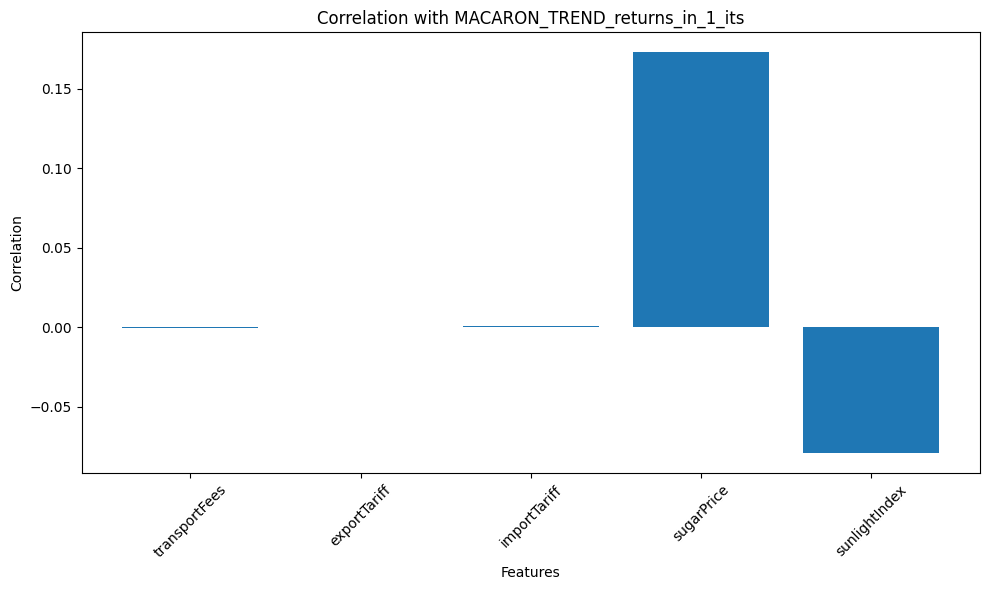

Iteration: 2
Correlation between transportFees_returns_from_2_its_ago and MACARON_TREND_returns_in_2_its: 0.00316369955794849
Correlation between exportTariff_returns_from_2_its_ago and MACARON_TREND_returns_in_2_its: 0.0038067069244000305
Correlation between importTariff_returns_from_2_its_ago and MACARON_TREND_returns_in_2_its: 0.003674120885297422
Correlation between sugarPrice_returns_from_2_its_ago and MACARON_TREND_returns_in_2_its: 0.23702824899605213
Correlation between sunlightIndex_returns_from_2_its_ago and MACARON_TREND_returns_in_2_its: -0.08294783038563579


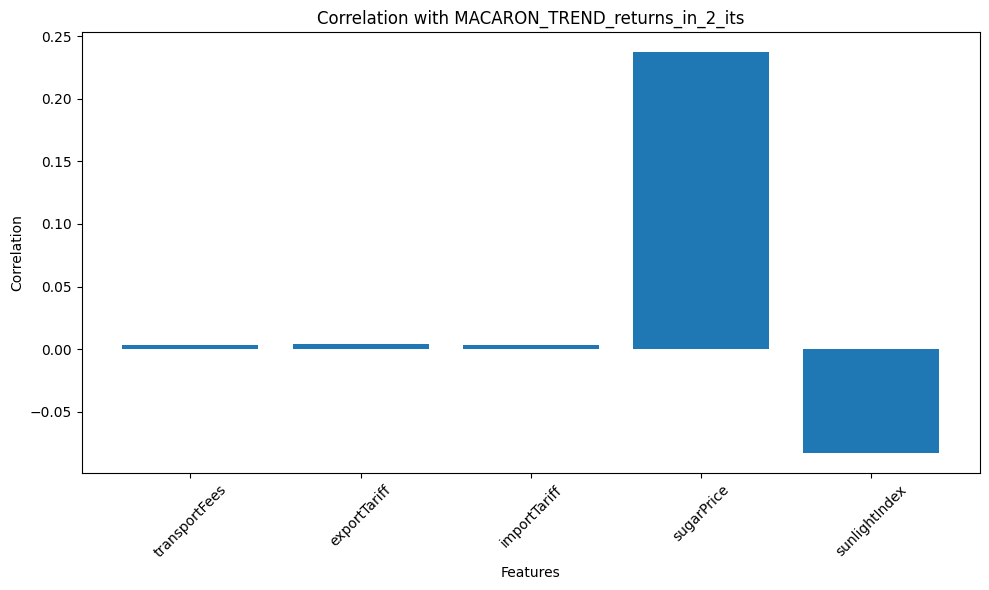

Iteration: 3
Correlation between transportFees_returns_from_3_its_ago and MACARON_TREND_returns_in_3_its: 0.007068741967960252
Correlation between exportTariff_returns_from_3_its_ago and MACARON_TREND_returns_in_3_its: 0.00691458571906138
Correlation between importTariff_returns_from_3_its_ago and MACARON_TREND_returns_in_3_its: 0.004168451919867822
Correlation between sugarPrice_returns_from_3_its_ago and MACARON_TREND_returns_in_3_its: 0.2785133819497775
Correlation between sunlightIndex_returns_from_3_its_ago and MACARON_TREND_returns_in_3_its: -0.08544923357691231


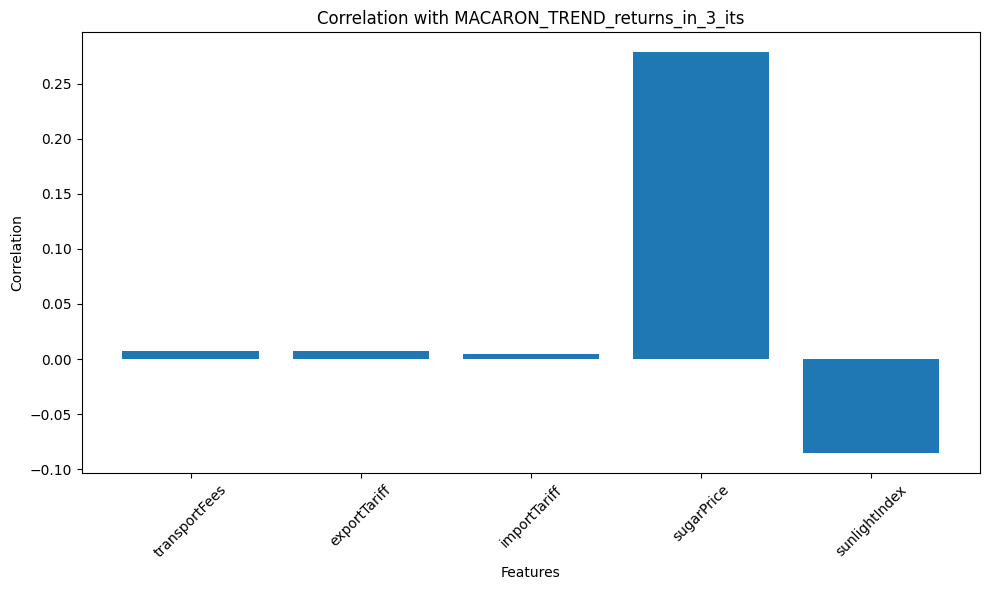

Iteration: 4
Correlation between transportFees_returns_from_4_its_ago and MACARON_TREND_returns_in_4_its: 0.010833265229822177
Correlation between exportTariff_returns_from_4_its_ago and MACARON_TREND_returns_in_4_its: 0.007684376535493448
Correlation between importTariff_returns_from_4_its_ago and MACARON_TREND_returns_in_4_its: 0.0027328607985087306
Correlation between sugarPrice_returns_from_4_its_ago and MACARON_TREND_returns_in_4_its: 0.3091428370762635
Correlation between sunlightIndex_returns_from_4_its_ago and MACARON_TREND_returns_in_4_its: -0.08693184350430978


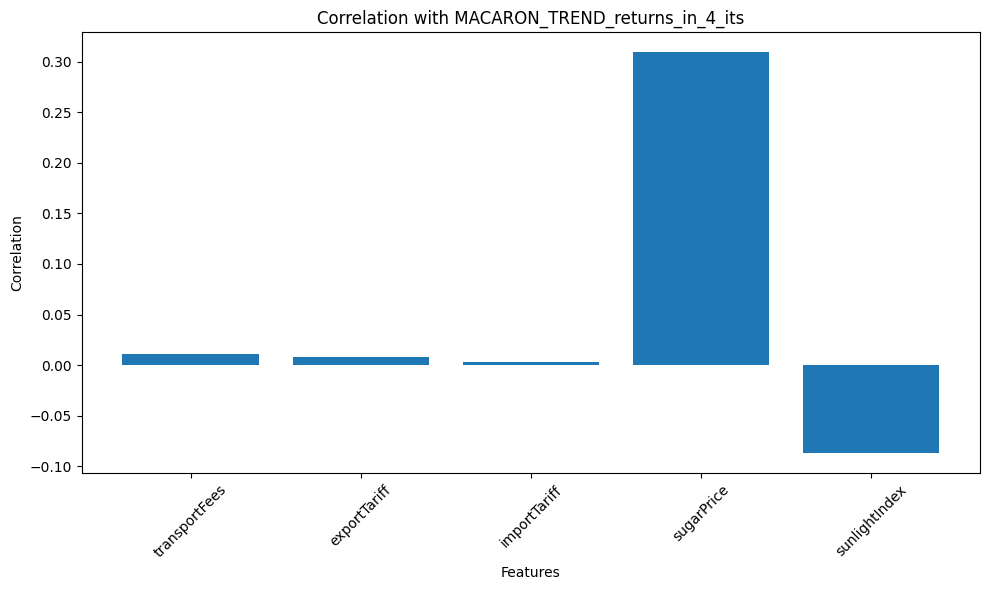

Iteration: 5
Correlation between transportFees_returns_from_5_its_ago and MACARON_TREND_returns_in_5_its: 0.01441032394959545
Correlation between exportTariff_returns_from_5_its_ago and MACARON_TREND_returns_in_5_its: 0.007634664850402927
Correlation between importTariff_returns_from_5_its_ago and MACARON_TREND_returns_in_5_its: -0.0007467045581099596
Correlation between sugarPrice_returns_from_5_its_ago and MACARON_TREND_returns_in_5_its: 0.3318865336293131
Correlation between sunlightIndex_returns_from_5_its_ago and MACARON_TREND_returns_in_5_its: -0.08818687484345591


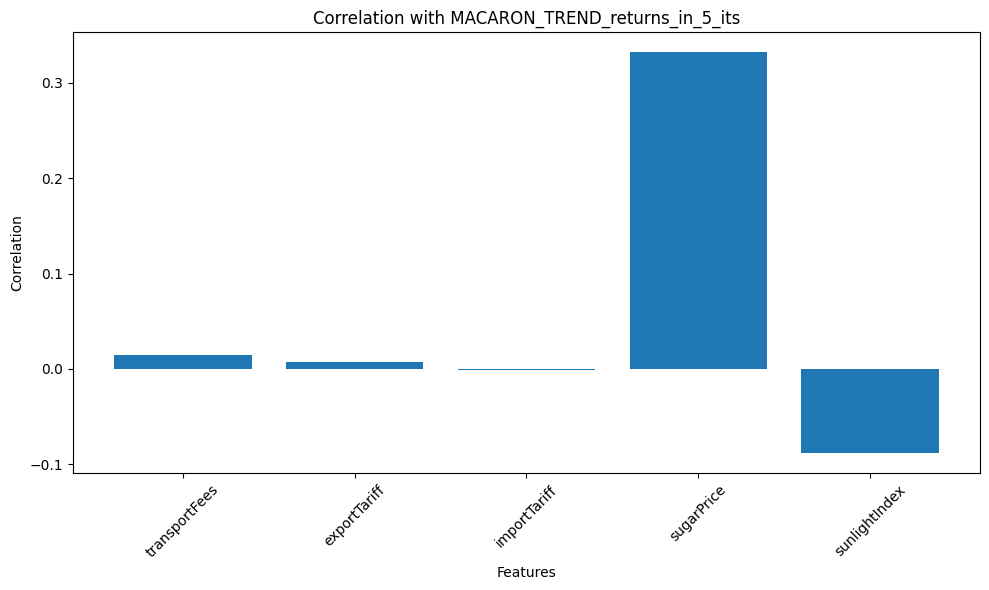

In [86]:
iteration_candidates = [1, 2, 3, 4, 5]

for iteration in iteration_candidates:
    print(f"Iteration: {iteration}")
    new_df = generate_returns_dataframe(all_df, iteration)
    correlations = calculate_correlation(new_df, iteration)

    # print corr values
    for col, corr in correlations.items():
        print(f"Correlation between {col}_returns_from_{iteration}_its_ago and MACARON_TREND_returns_in_{iteration}_its: {corr}")

    # bar graph of factor corr
    plt.figure(figsize=(10, 6))
    plt.bar(correlations.keys(), correlations.values())
    plt.xlabel('Features')
    plt.ylabel('Correlation')
    plt.title(f"Correlation with MACARON_TREND_returns_in_{iteration}_its")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

In [87]:
iteration = 5
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
new_df = generate_returns_dataframe(all_df, iteration).dropna()
X = new_df[f"sugarPrice_returns_from_{iteration}_its_ago"].values.reshape(-1, 1)
Y = new_df[f"MACARON_TREND_returns_in_{iteration}_its"].values.reshape(-1, 1)

model = LinearRegression(fit_intercept=False)
model.fit(X, Y)

coefficient = model.coef_[0][0]
print(f"Coefficient (Slope) of SLR: {coefficient}")

Coefficient (Slope) of SLR: 0.4617283181959772


In [88]:
new_df.head()

,day,timestamp,product,bid_price_1,bid_volume_1,bid_price_2,bid_volume_2,bid_price_3,bid_volume_3,ask_price_1,...,sugarPrice,sunlightIndex,sun_DIFF,MACARON_TREND_returns_from_5_its_ago,MACARON_TREND_returns_in_5_its,transportFees_returns_from_5_its_ago,exportTariff_returns_from_5_its_ago,importTariff_returns_from_5_its_ago,sugarPrice_returns_from_5_its_ago,sunlightIndex_returns_from_5_its_ago
5,1,1000500,MAGNIFICENT_MACARONS,631.00000,10.00000,629.00000,16.00000,624.00000,23.00000,638,...,200.53319,60.01000,0.01000,0.00611,0.00211,0.00000,0.00000,-0.00000,0.00267,0.00017
6,1,1000600,MAGNIFICENT_MACARONS,631.00000,12.00000,628.00000,17.00000,623.00000,28.00000,638,...,200.52734,60.02000,0.02000,0.00449,0.00177,0.00000,0.00000,-0.00000,0.00214,0.00033
7,1,1000700,MAGNIFICENT_MACARONS,630.00000,20.00000,627.00000,11.00000,622.00000,22.00000,637,...,200.84035,60.02000,0.02000,0.00406,0.00179,0.00000,0.00000,-0.00000,0.00368,0.00033
8,1,1000800,MAGNIFICENT_MACARONS,631.00000,10.00000,629.00000,19.00000,624.00000,24.00000,638,...,200.91509,60.02000,0.02000,0.00330,0.00124,0.00000,0.00000,-0.00000,0.00281,0.00017
9,1,1000900,MAGNIFICENT_MACARONS,630.00000,20.00000,627.00000,12.00000,622.00000,20.00000,637,...,200.66244,60.02000,0.02000,0.00311,0.00115,0.00000,0.00000,-0.00000,0.00230,0.00017


In [89]:
equation = f"MACARON_TREND_returns_in_{iteration}_its = {coefficient:.4f} * sugarPrice_returns_from_{iteration}_its_ago"
print(f"SLR Equation: {equation}")

SLR Equation: MACARON_TREND_returns_in_5_its = 0.4617 * sugarPrice_returns_from_5_its_ago


In [90]:
# prediction
y_pred = model.predict(X)

# mean-squared error
mse = mean_squared_error(Y, y_pred)
print(f"\nMean Squared Error (MSE): {mse:.4f}")

# R^2 = 1 - np.sum((Y - y_pred) ** 2) / np.sum(Y ** 2) for beta_0 = 0
r2 = r2_score(Y, y_pred)
print(f"R-squared (R^2) Value: {r2:.4f}")


Mean Squared Error (MSE): 0.0000
R-squared (R^2) Value: 0.1100


In [98]:
# add prediction to dataframe
new_df['MACARON_TREND_pred_returns'] = y_pred.ravel()

In [100]:
# actual vs predicted
fig = go.Figure([
    go.Scatter(
        x=new_df['timestamp'],
        y=new_df[f"MACARON_TREND_returns_in_{iteration}_its"],
        mode='lines',
        name='Actual'
    ),
    go.Scatter(
        x=new_df['timestamp'],
        y=new_df['MACARON_TREND_pred_returns'],
        mode='lines',
        name='Predicted',
        line=dict(dash='dash')
    )
])
fig.update_layout(
    title='Actual vs Predicted MACARON_TREND Returns',
    xaxis_title='Timestamp',
    yaxis_title='Returns'
)
fig.show()

In [101]:
new_df['residual'] = new_df[f"MACARON_TREND_returns_in_{iteration}_its"] - new_df['MACARON_TREND_pred_returns']
mse = (new_df['residual']**2).mean()
rmse = np.sqrt(mse)
# for rolling:
new_df['rmse_rolling'] = new_df['residual'].rolling(100).apply(lambda x: np.sqrt((x**2).mean()))